# Intoduction to the xarray EOPF backend

**xarray-eopf** is a Python package that extends **xarray** with a custom backend called `"eopf-zarr"`. This backend enables **seamless access to ESA EOPF data products** stored in the **Zarr** format, presenting them as analysis-ready data structures.

This notebook demonstrates how to use the **xarray-eopf** backend to access EOPF Zarr datasets. It highlights the key features currently supported by the backend.

- 🐙 **GitHub:** [EOPF Sample Service – xarray-eopf](https://github.com/EOPF-Sample-Service/xarray-eopf)  
- ❗ **Issue Tracker:** [Submit or view issues](https://github.com/EOPF-Sample-Service/xarray-eopf/issues)  
- 📘 **Documentation:** [xarray-eopf Docs](https://eopf-sample-service.github.io/xarray-eopf/)

---

## Install the xarray-eopf Backend

The backend is implemented as an **xarray plugin** and can be installed using either `pip` or `conda/mamba` from the conda-forge channel.

- 📦 **PyPI:** [xarray-eopf on PyPI](https://pypi.org/project/xarray-eopf/)  `pip install xarray-eopf`
- 🐍 **Conda (conda-forge):** [xarray-eopf on Anaconda](https://anaconda.org/conda-forge/xarray-eopf) `conda install -c conda-forge xarray-eopf`

  You can also use **Mamba** as a faster alternative to Conda: `mamba install -c conda-forge xarray-eopf`

---

## Import Modules

The `xarray-eopf` backend is implemented as a plugin for `xarray`. Once installed, it registers automatically and requires no additional import. You can simply import `xarray` as usual:

In [1]:
import pystac_client
import xarray as xr

---

## Main Features of the xarray-eopf Backend

The xarray-eopf backend for EOPF data products can be selecterd by setting `engine="eopf-zarr"` in `xarray.open_dataset(..)` and `xarray.open_datatree(..)` method. It supports two modes of operation:

- **Analysis Mode** *(default)*
- **Native Mode**

### Native Mode

Represents EOPF products without modification using `xarray`'s `DataTree` and `Dataset`.

- `open_dataset(..)` — Returns a *flattened* version of the data tree  
- `open_datatree(..)` — Returns the full `DataTree`, same as `xr.open_datatree(.., engine="zarr")`

### Analysis Mode

Provides an analysis-ready, resampled view of the data (currently for **Sentinel-2** only).

- `open_dataset(..)` — Loads Sentinel-2 products in a harmonized, analysis-ready format  
- `open_datatree(..)` — Not implemented in this mode (`NotImplementedError`)
  

📚 **More info:** [xarray-eopf Guide](https://eopf-sample-service.github.io/xarray-eopf/guide/)

---

## Find a Sentinel Zarr Sample via STAC

We begin with an example that accesses a Sentinel-2 Level-2A product in **native mode**.

To obtain a product URL, you can use the [STAC Browser](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-2-l2a) to search for a Sentinel-2 tile.

In [22]:
%%time
catalog = pystac_client.Client.open("https://stac.core.eopf.eodc.eu")
items = list(
    catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=[7.2, 44.5, 7.4, 44.7],
        datetime=["2026-03-01", "2026-03-01"],
    ).items()
)
items

CPU times: user 10.9 ms, sys: 3 ms, total: 13.9 ms
Wall time: 1.43 s


[<Item id=S2C_MSIL2A_20260301T101941_N0512_R065_T32TLQ_20260301T154010>]

Next, we can inspect the item’s contents, including the additional field `xarray:open_datatree_kwargs`, which provides the arguments needed to open the product using Xarray’s `eopf-zarr` engine.

In [23]:
item = items[0]
item

<Item id=S2C_MSIL2A_20260301T101941_N0512_R065_T32TLQ_20260301T154010>

## Open the Product in Native Mode

### Open Sentinel-2 Level-2A as `xarray.DataTree`

We can use the `"product"` asset to obtain the `href` and `xarray:open_datatree_kwargs` from the STAC item, and open the product as an `xarray.DataTree` as shown below:

In [24]:
%%time
dt = xr.open_datatree(
    item.assets["product"].href,
    **item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]
)
dt

CPU times: user 397 ms, sys: 14.2 ms, total: 411 ms
Wall time: 3.72 s


<xarray.DataTree>
Group: /
│   Attributes: (3)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 4)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b00' 'b01' ... 'b11' 'b12'
│   │         * detector                       (detector) <U3 48B 'd01' 'd02' 'd03' 'd04'
│   │         * x                              (x) float32 92B 3e+05 3.05e+05 ... 4.1e+05
│   │         * y                              (y) float32 92B 5e+06 4.995e+06 ... 4.89e+06
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 440kB dask.array<chunksize=(13, 4, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) float32 44kB 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05
│   │   │   │         * y        (y) float32 44kB 5e+06 5e+06 5e+06 ... 4.89e+06 4.89e+06 4.89e+06
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) float32 22kB 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05
│   │   │   │         * y        (y) float32 22kB 5e+06 5e+06 5e+06 ... 4.89e+06 4.89e+06 4.89e+06
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * x        (x) float32 7kB 3e+05 3.001e+05 3.002e+05 ... 4.097e+05 4.098e+05
│   │   │             * y        (y) float32 7kB 5e+06 5e+06 5e+06 ... 4.89e+06 4.89e+06 4.89e+06
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   ├── Group: /conditions/mask/l1c_classification
│   │   │   └── Group: /conditions/mask/l1c_classification/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:

As an example, we plot the 60 meters RGB image to view the image. 

CPU times: user 210 ms, sys: 18.3 ms, total: 229 ms
Wall time: 608 ms


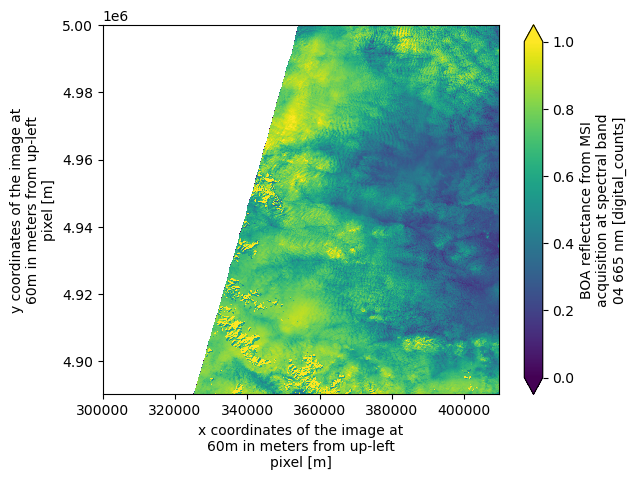

In [30]:
%%time
dt.measurements.reflectance.r60m.b04.plot.imshow(vmin=0, vmax=1)

### Open Sentinel-2 Level-2A refelctance groups as `xarray.Dataset`

Similarily, we can open the individual reflectance groups at 10m (asseet "SR_10m"), 20m (asseet "SR_20m"), and 60m (asseet "SR_60m") to open the individual groups as an `xarray.Dataset` as shown below:

In [33]:
%%time
dt = xr.open_datatree(
    item.assets["SR_60m"].href,
    **item.assets["SR_60m"].extra_fields["xarray:open_dataset_kwargs"]
)
dt

CPU times: user 19.4 ms, sys: 2.93 ms, total: 22.4 ms
Wall time: 489 ms


<xarray.DataTree>
Group: /
    Dimensions:  (y: 1830, x: 1830)
    Coordinates:
      * x        (x) float32 7kB 3e+05 3.001e+05 3.002e+05 ... 4.097e+05 4.098e+05
      * y        (y) float32 7kB 5e+06 5e+06 5e+06 ... 4.89e+06 4.89e+06 4.89e+06
    Data variables:
        b01      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b02      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b03      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b04      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b05      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b06      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b07      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b09      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b11      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b12      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
        b8a      (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>

In [ ]:
im = dt.quality.l2a_quicklook.r60m.tci.plot.imshow(rgb="band")
im.axes.set_aspect("equal")

### Open Sentinel-2 Level-2A as `xarray.Dataset`

The `xarray.DataTree` data model is relatively new, introduced in [xarray v2024.10.0](https://docs.xarray.dev/en/v2024.10.0/whats-new.html) (October 2024). To support compatibility with existing workflows that rely on the traditional `xr.Dataset` model, we provide the function `xarray.open_dataset(path, engine="eopf-zarr", op_mode="native", **kwargs)`. This function flattens the `DataTree` structure and returns a single `xr.Dataset`.

In this process, hierarchical groups within the Zarr product are removed by converting their contents into standalone datasets and merging them into one. To ensure uniqueness, variable and dimension names are prefixed with their original group paths, using an underscore (`_`) as the default separator. For example, a variable named `b02` located in the group `measurements/reflectance/r10m` will be renamed to `measurements_reflectance_r10m_b02` in the returned dataset.


In [6]:
%%time
ds = xr.open_dataset(
    item.assets["product"].href,
    engine="eopf-zarr",
    op_mode="native",
    chunks={},
)
ds

CPU times: user 215 ms, sys: 10.6 ms, total: 226 ms
Wall time: 4.08 s


<xarray.Dataset> Size: 9GB
Dimensions:                                            (
                                                        conditions_geometry_angle: 2,
                                                        conditions_geometry_band: 13,
                                                        conditions_geometry_y: 23,
                                                        conditions_geometry_x: 23,
                                                        conditions_geometry_detector: 4,
                                                        ...
                                                        quality_mask_r20m_y: 5490,
                                                        quality_mask_r20m_x: 5490,
                                                        quality_mask_r60m_y: 1830,
                                                        quality_mask_r60m_x: 1830,
                                                        quality_probability_y: 5490,
                                                        quality_probability_x: 5490)
Coordinates: (12/63)
  * conditions_geometry_angle                          (conditions_geometry_angle) <U7 56B ...
  * conditions_geometry_band                           (conditions_geometry_band) <U3 156B ...
  * conditions_geometry_detector                       (conditions_geometry_detector) int64 32B ...
  * conditions_geometry_x                              (conditions_geometry_x) int64 184B ...
  * conditions_geometry_y                              (conditions_geometry_y) int64 184B ...
  * conditions_mask_detector_footprint_r10m_x          (conditions_mask_detector_footprint_r10m_x) int64 88kB ...
    ...                                                 ...
  * quality_mask_r20m_y                                (quality_mask_r20m_y) int64 44kB ...
  * quality_mask_r60m_x                                (quality_mask_r60m_x) int64 15kB ...
  * quality_mask_r60m_y                                (quality_mask_r60m_y) int64 15kB ...
    quality_probability_band                           int64 8B ...
  * quality_probability_x                              (quality_probability_x) int64 44kB ...
  * quality_probability_y                              (quality_probability_y) int64 44kB ...
Data variables: (12/86)
    conditions_geometry_mean_sun_angles                (conditions_geometry_angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
    conditions_geometry_mean_viewing_incidence_angles  (conditions_geometry_band, conditions_geometry_angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
    conditions_geometry_sun_angles                     (conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
    conditions_geometry_viewing_incidence_angles       (conditions_geometry_band, conditions_geometry_detector, conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 440kB dask.array<chunksize=(7, 4, 2, 23, 23), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b02        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b03        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    ...                                                 ...
    quality_mask_r20m_b8a                              (quality_mask_r20m_y, quality_mask_r20m_x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
    quality_mask_r60m_b01                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    quality_mask_r60m_b09                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndar

The separator character used in flattened variable names can be customized via the `group_sep` parameter. Additionally, you can filter the returned variables using the `variables` keyword argument, which accepts a string, an iterable of names, or a regular expression (regex) pattern.

In [7]:
ds = xr.open_dataset(
    item.assets["product"].href,
    engine="eopf-zarr",
    op_mode="native",
    chunks={},
    group_sep="/",
    variables="measurements/r60m/b0[234]",
)
ds

<xarray.Dataset> Size: 80MB
Dimensions:                (measurements/r60m/y: 1830, measurements/r60m/x: 1830)
Coordinates:
  * measurements/r60m/x    (measurements/r60m/x) int64 15kB 300030 ... 409770
  * measurements/r60m/y    (measurements/r60m/y) int64 15kB 5000010 ... 4890270
Data variables:
    measurements/r60m/b02  (measurements/r60m/y, measurements/r60m/x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    measurements/r60m/b03  (measurements/r60m/y, measurements/r60m/x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    measurements/r60m/b04  (measurements/r60m/y, measurements/r60m/x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
Attributes: (2)

Following the previous steps, we can now select a data variable and display the RGB image as an example.


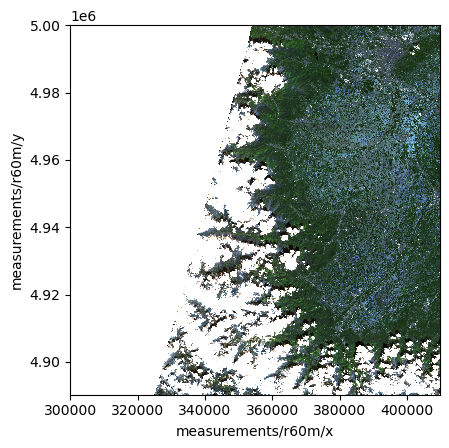

In [8]:
ax = (ds.to_dataarray(dim="band") / 0.3).clip(0, 1).plot.imshow(rgb="band")
ax.axes.set_aspect("equal")

### Sentinel-1 GRD as `xarray.DataTree`

Lets show a second example where we want to open a Sentinel-1 GRD product with the `"eopf-zarr"` engine. First, we use the [STAC Browser](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-1-l1-grd) to search for a Sentinel-1 GRD tile.

In [14]:
%%time
catalog = pystac_client.Client.open("https://stac.core.eopf.eodc.eu")
items = list(
    catalog.search(
        collections=["sentinel-1-l1-grd"],
        bbox=[-86., 72., -85., 73.],
        datetime=["2026-03-17", "2026-03-17"],
    ).items()
)
items

CPU times: user 12.4 ms, sys: 2.05 ms, total: 14.5 ms
Wall time: 534 ms


[<Item id=S1C_EW_GRDM_1SDH_20260317T125114_20260317T125219_006804_00DC0C_3371>]

In [16]:
item = items[0]
item

<Item id=S1C_EW_GRDM_1SDH_20260317T125114_20260317T125219_006804_00DC0C_3371>

Next, we use `xr.open_datatree` to open the EOPF Zarr product as an `xr.DataTree` as shown before.

In [15]:
%%time
dt = xr.open_datatree(
    item.assets["product"].href,
    **item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]
)
dt

CPU times: user 208 ms, sys: 10.6 ms, total: 219 ms
Wall time: 3.6 s


<xarray.DataTree>
Group: /
│   Attributes: (2)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 4)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
│   │         * detector                       (detector) int64 32B 1 2 3 4
│   │         * x                              (x) int64 184B 300000 305000 ... 410000
│   │         * y                              (y) int64 184B 5000040 4995040 ... 4890040
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 440kB dask.array<chunksize=(7, 4, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
│   │   │   │         * y        (y) int64 88kB 5000035 5000025 5000015 ... 4890265 4890255 4890245
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) int64 44kB 300010 300030 300050 300070 ... 409750 409770 409790
│   │   │   │         * y        (y) int64 44kB 5000030 5000010 4999990 ... 4890290 4890270 4890250
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * x        (x) int64 15kB 300030 300090 300150 300210 ... 409650 409710 409770
│   │   │             * y        (y) int64 15kB 5000010 4999950 4999890 ... 4890390 4890330 4890270
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   ├── Group: /conditions/mask/l1c_classification
│   │   │   └── Group: /conditions/mask/l1c_classification/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordina

Similarly, we can open the Sentinel-1 GRD Zarr product using `xr.open_dataset` to obtain an `xr.Dataset`, just as we did earlier for the Sentinel-2 L2A product, where we filter by `"VH_measurements*"`.

In [87]:
ds = xr.open_dataset(
    path, engine="eopf-zarr", op_mode="native", chunks={}, variables="VH_measurements*"
)
ds

<xarray.Dataset> Size: 883MB
Dimensions:                       (VH_measurements_azimuth_time: 16675,
                                   VH_measurements_ground_range: 26450)
Coordinates:
  * VH_measurements_azimuth_time  (VH_measurements_azimuth_time) datetime64[ns] 133kB ...
  * VH_measurements_ground_range  (VH_measurements_ground_range) float64 212kB ...
    VH_measurements_line          (VH_measurements_azimuth_time) int64 133kB dask.array<chunksize=(2048,), meta=np.ndarray>
    VH_measurements_pixel         (VH_measurements_ground_range) int64 212kB dask.array<chunksize=(4096,), meta=np.ndarray>
Data variables:
    VH_measurements_grd           (VH_measurements_azimuth_time, VH_measurements_ground_range) uint16 882MB dask.array<chunksize=(2048, 4096), meta=np.ndarray>
Attributes: (2)

As a final step, we plot the VH measurement to provide a visual example of the data.

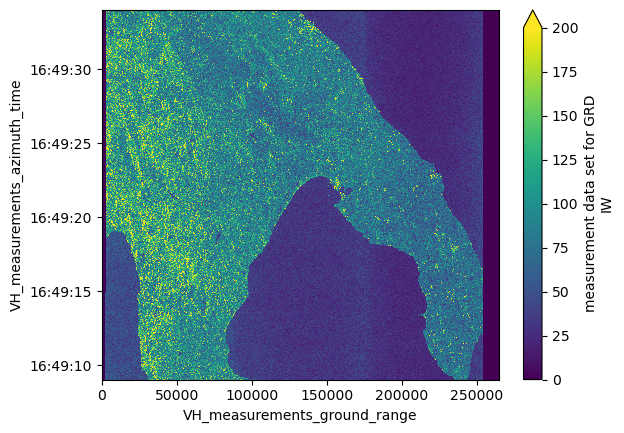

In [88]:
ds["VH_measurements_grd"][::10, ::10].plot(vmax=200)

---

(Analysis_XEOPF)=
## Open the Product in Analysis Mode

Currently, analysis mode is available only for Sentinel-2 products. Support for Sentinel-3 and Sentinel-1 will be added in upcoming releases.

The **analysis mode** is designed to present EOPF data products in an **analysis-ready and user-friendly** format using xarray’s `Dataset` data model. For Sentinel-2 products, it applies a unified grid mapping across all data variables, meaning selected variables are spatially upscaled or downscaled as needed. This ensures the resulting dataset uses a single, consistent pair of `x` and `y` coordinates for all variables.


### Native resolution of each Sentinel-2 spectral band 

* 10m: [b02, b03, b04, b08]
* 20m: [b05, b06, b07, b8a, b11, b12]
* 60m: [b01, b09, b10]

### Analysis mode for Sentinel-2

The analysis mode for Sentinel-2 has the following key properties:

- **Default mode** when using the `"eopf-zarr"` backend.
- **Spatial resolution options:** Users can choose between 10m, 20m, and 60m, with 10m as the default.
- **Upsampling:**  
  - Performed via 2D interpolation controlled by the `spline_orders` argument.  
  - Accepts a single spline order for all variables or a dictionary mapping spline orders to variable names or data types.  
  - Supported spline orders: 0 (nearest neighbor, default for `scl`), 1 (linear), 2 (bi-linear), 3 (cubic, default).
- **Downsampling:**  
  - Done through aggregation methods governed by the `agg_methods` argument.  
  - Can be a single method for all variables or a dictionary mapping methods to variable names or data types.  
  - Available methods include `"center"` (default for `scl`), `"count"`, `"first"`, `"last"`, `"max"`, `"mean"` (default), `"median"`, `"mode"`, `"min"`, `"prod"`, `"std"`, `"sum"`, and `"var"`. 
- **Variable selection:** Specific variables can be selected via the `variables` argument, which accepts a variable name, a regex pattern, or an iterable of either.

More details are available in the [documentation](https://eopf-sample-service.github.io/xarray-eopf/api/#xarray_eopf.backend.EopfBackend.open_dataset).

Note: Default up- and downsampling methods follow ESA's Sentinel-2 Level 2A guidelines ([documentation PDF](https://step.esa.int/thirdparties/sen2cor/2.10.0/docs/S2-PDGS-MPC-L2A-ATBD-V2.10.0.pdf)).


In [89]:
path = (
    "https://objects.eodc.eu/e05ab01a9d56408d82ac32d69a5aae2a:notebook-data/tutorial_data/"
    "cpm_v262/S2A_MSIL2A_20200707T101031_N0500_R022_T32TPS_20230614T182201.zarr"
)

By default, without specifying any keyword arguments, the function returns an `xr.Dataset` with all spectral bands at 10m spatial resolution.


In [90]:
%%time
ds_default = xr.open_dataset(path, engine="eopf-zarr", chunks={})
ds_default

CPU times: user 489 ms, sys: 4.95 ms, total: 494 ms
Wall time: 1.41 s


<xarray.Dataset> Size: 14GB
Dimensions:      (y: 10980, x: 10980)
Coordinates:
    spatial_ref  int64 8B ...
  * x            (x) float32 44kB 6e+05 6e+05 6e+05 ... 7.098e+05 7.098e+05
  * y            (y) float32 44kB 5.2e+06 5.2e+06 5.2e+06 ... 5.09e+06 5.09e+06
Data variables: (12/15)
    b02          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b03          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b04          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b08          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b01          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b05          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    ...           ...
    b12          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b8a          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    cld          (y, x) float32 482MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    snw          (y, x) float32 482MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    scl          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b09          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
Attributes: (24)

Now, we can explore how to configure the processing using the available keyword arguments.

In [91]:
ds_nearest = xr.open_dataset(
    path,
    engine="eopf-zarr",
    chunks={},
    interp_methods="nearest",
    variables=["b01", "b02", "scl"],
)
ds_nearest

<xarray.Dataset> Size: 3GB
Dimensions:      (y: 10980, x: 10980)
Coordinates:
    spatial_ref  int64 8B ...
  * x            (x) float32 44kB 6e+05 6e+05 6e+05 ... 7.098e+05 7.098e+05
  * y            (y) float32 44kB 5.2e+06 5.2e+06 5.2e+06 ... 5.09e+06 5.09e+06
Data variables:
    b02          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    b01          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    scl          (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
Attributes: (24)

We can now compare the different upsampling methods for "b01", which native resolution is at 60m. 

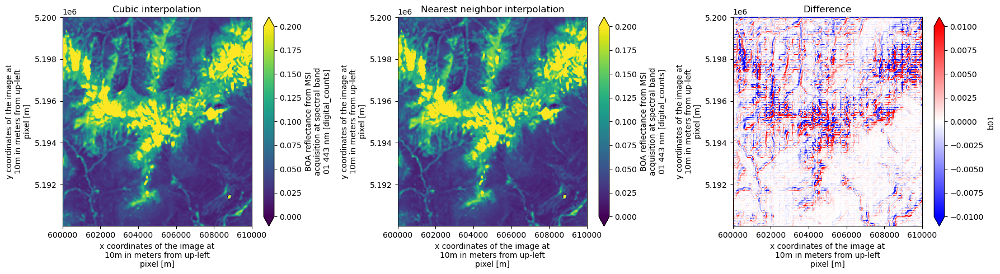

In [92]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
ds_default.b01[:1000, :1000].plot(ax=ax[0], vmin=0.0, vmax=0.2)
ax[0].set_title("Cubic interpolation")
ds_nearest.b01[:1000, :1000].plot(ax=ax[1], vmin=0.0, vmax=0.2)
ax[1].set_title("Nearest neighbor interpolation")
(ds_default.b01 - ds_nearest.b01)[:1000, :1000].plot(
    ax=ax[2], vmin=-0.01, vmax=0.01, cmap="bwr"
)
ax[2].set_title("Difference")
plt.tight_layout()

### Scene classification layer in Sentinel-2 L2A product

For the SCL, the flag names, values, and corresponding colors are added to the attributes to facilitate plotting. The colors are defined according to [Sentinel Hub’s specifications](https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/scene-classification/).

In [93]:
ds = xr.open_dataset(path, engine="eopf-zarr", chunks={}, resolution=60)
ds

<xarray.Dataset> Size: 375MB
Dimensions:      (y: 1830, x: 1830)
Coordinates:
    spatial_ref  int64 8B ...
  * x            (x) float32 7kB 6e+05 6.001e+05 ... 7.097e+05 7.098e+05
  * y            (y) float32 7kB 5.2e+06 5.2e+06 5.2e+06 ... 5.09e+06 5.09e+06
Data variables: (12/15)
    b08          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    cld          (y, x) float32 13MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    snw          (y, x) float32 13MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b01          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b02          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b03          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    ...           ...
    b07          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b09          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b11          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b12          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b8a          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    scl          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
Attributes: (24)

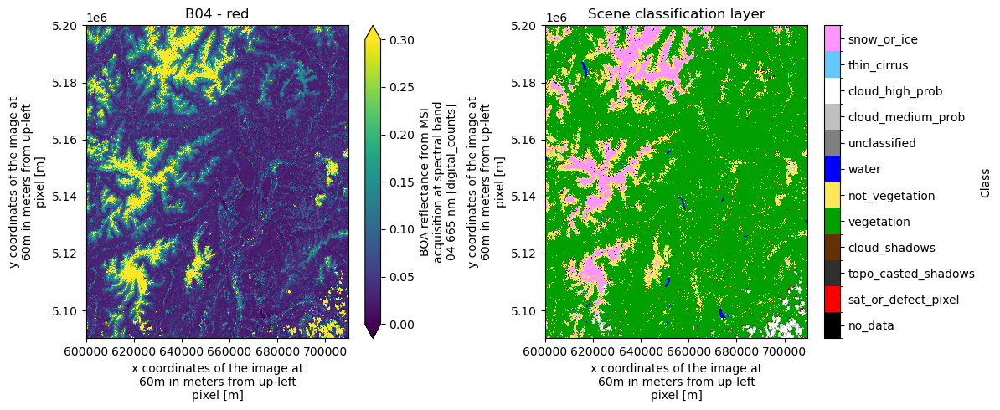

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

ds.b04.plot(ax=ax[0], vmin=0.0, vmax=0.3)
ax[0].set_title("B04 - red")

cmap = mcolors.ListedColormap(ds.scl.attrs["flag_colors"].split(" "))
nb_colors = len(ds.scl.attrs["flag_values"])
norm = mcolors.BoundaryNorm(
    boundaries=np.arange(nb_colors + 1) - 0.5, ncolors=nb_colors
)
im = ds.scl.plot.imshow(ax=ax[1], cmap=cmap, norm=norm, add_colorbar=False)
cbar = fig.colorbar(im, ax=ax[1], ticks=ds.scl.attrs["flag_values"])
cbar.ax.set_yticklabels(ds.scl.attrs["flag_meanings"].split(" "))
cbar.set_label("Class")
ax[1].set_title("Scene classification layer")

plt.tight_layout()

### Sentinel-2 L1C

Let’s now open a Sentinel-2 L1C product. In this product, each band is available only at its native resolution. This allows us to demonstrate the aggregation mode used during downsampling.

In [95]:
path = (
    "https://objectstore.eodc.eu:2222/e05ab01a9d56408d82ac32d69a5aae2a:202504-s02msil1c/30/products"
    "/cpm_v256/S2B_MSIL1C_20250430T101559_N0511_R065_T32TLQ_20250430T124542.zarr"
)

As explained above, the default aggregation method for spectral bands during downsampling is to take the mean of the superpixel.

In [96]:
ds_agg_mean = xr.open_dataset(path, engine="eopf-zarr", chunks={}, resolution=60)
ds_agg_mean

<xarray.Dataset> Size: 348MB
Dimensions:      (y: 1830, x: 1830)
Coordinates:
    spatial_ref  int64 8B ...
  * x            (x) int64 15kB 300030 300090 300150 ... 409650 409710 409770
  * y            (y) int64 15kB 5000010 4999950 4999890 ... 4890330 4890270
Data variables: (12/13)
    b02          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b03          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b04          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b08          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b05          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b06          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    ...           ...
    b11          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b12          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b8a          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b01          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b09          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b10          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
Attributes: (26)

As a second dataset, we apply `"max"` as aggregation mode. 

In [97]:
ds_agg_max = xr.open_dataset(
    path, engine="eopf-zarr", chunks={}, resolution=60, agg_methods="max"
)
ds_agg_max

<xarray.Dataset> Size: 348MB
Dimensions:      (y: 1830, x: 1830)
Coordinates:
    spatial_ref  int64 8B ...
  * x            (x) int64 15kB 300030 300090 300150 ... 409650 409710 409770
  * y            (y) int64 15kB 5000010 4999950 4999890 ... 4890330 4890270
Data variables: (12/13)
    b02          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b03          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b04          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b08          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b05          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b06          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    ...           ...
    b11          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b12          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b8a          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b01          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b09          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    b10          (y, x) float64 27MB dask.array<chunksize=(305, 305), meta=np.ndarray>
Attributes: (26)

Next, we plot the spectral band B04 (red) alongside the difference between the two aggregation modes.


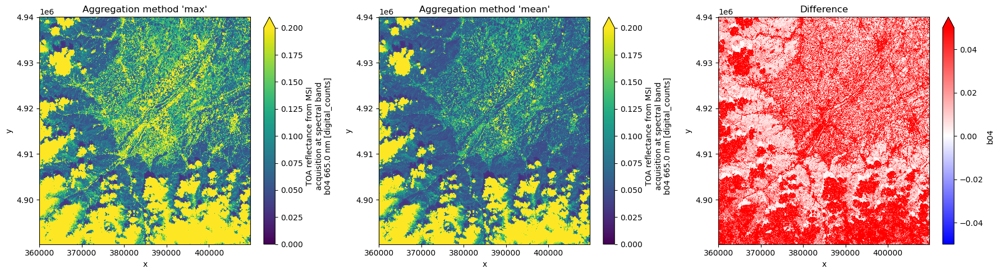

In [98]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
ds_agg_max.b04[1000::, 1000::].plot(ax=ax[0], vmin=0.0, vmax=0.2)
ax[0].set_title("Aggregation method 'max'")
ds_agg_mean.b04[1000::, 1000::].plot(ax=ax[1], vmin=0.0, vmax=0.2)
ax[1].set_title("Aggregation method 'mean'")
(ds_agg_max.b04 - ds_agg_mean.b04)[1000::, 1000::].plot(
    ax=ax[2], vmin=-0.05, vmax=0.05, cmap="bwr"
)
ax[2].set_title("Difference")
plt.tight_layout()

---

(STAC_XEOPF)=
## Integration with the STAC Item

- The STAC API at `https://stac.core.eopf.eodc.eu` allows searching for tiles by bounding box and time range.
- The `"product"` asset can be used to open an EOPF Zarr product.
- Additional fields in the asset provide the parameters required to open the dataset.
- Assets representing individual bands are also available; Xarray integration for these is still a work in progress.

First, we use `pystac_client` to query the catalog based on a given bounding box and temporal range.


In [99]:
catalog = pystac_client.Client.open("https://stac.core.eopf.eodc.eu")
items = list(
    catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=[3.54, 50.86, 3.55, 50.87],
        datetime=["2019-05-30", "2019-06-30"],
    ).items()
)
items

[<Item id=S02MSIL2A_20190630T105039_0000_B051_T443>,
 <Item id=S02MSIL2A_20190628T105621_0000_A094_T956>,
 <Item id=S02MSIL2A_20190625T105031_0000_A051_T207>,
 <Item id=S02MSIL2A_20190623T105629_0000_B094_T590>,
 <Item id=S02MSIL2A_20190620T105039_0000_B051_T771>,
 <Item id=S02MSIL2A_20190618T105621_0000_A094_T945>,
 <Item id=S02MSIL2A_20190615T105031_0000_A051_T340>,
 <Item id=S02MSIL2A_20190608T105621_0000_A094_T458>,
 <Item id=S02MSIL2A_20190605T105031_0000_A051_T930>,
 <Item id=S02MSIL2A_20190603T105629_0000_B094_T793>,
 <Item id=S02MSIL2A_20190531T105039_0000_B051_T099>]

<Asset href=https://objects.eodc.eu:443/e05ab01a9d56408d82ac32d69a5aae2a:notebook-data/tutorial_data/cpm_v260/S2B_MSIL2A_20190630T105039_N0500_R051_T31UES_20230723T112319.zarr>

<xarray.DataTree>
Group: /
│   Attributes: (2)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 7)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b00' 'b01' ... 'b11' 'b12'
│   │         * detector                       (detector) <U3 84B 'd03' 'd04' ... 'd09'
│   │         * x                              (x) float32 92B 5e+05 5.05e+05 ... 6.1e+05
│   │         * y                              (y) float32 92B 5.7e+06 ... 5.59e+06
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 770kB dask.array<chunksize=(13, 7, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) float32 44kB 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05
│   │   │   │         * y        (y) float32 44kB 5.7e+06 5.7e+06 5.7e+06 ... 5.59e+06 5.59e+06
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * x        (x) float32 22kB 5e+05 5e+05 5e+05 ... 6.098e+05 6.098e+05
│   │   │   │         * y        (y) float32 22kB 5.7e+06 5.7e+06 5.7e+06 ... 5.59e+06 5.59e+06
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * x        (x) float32 7kB 5e+05 5.001e+05 5.001e+05 ... 6.097e+05 6.098e+05
│   │   │             * y        (y) float32 7kB 5.7e+06 5.7e+06 5.7e+06 ... 5.59e+06 5.59e+06
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   ├── Group: /conditions/mask/l1c_classification
│   │   │   └── Group: /conditions/mask/l1c_classification/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │         

The same applies to the `xr.open_dataset` method, which returns a flattened DataTree represented as an `xr.Dataset`.

In [102]:
ds = xr.open_dataset(
    item.assets["product"].href,
    **item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]
)
ds

<xarray.Dataset> Size: 11GB
Dimensions:                                            (
                                                        conditions_geometry_angle: 2,
                                                        conditions_geometry_band: 13,
                                                        conditions_geometry_y: 23,
                                                        conditions_geometry_x: 23,
                                                        conditions_geometry_detector: 7,
                                                        ...
                                                        quality_mask_r20m_y: 5490,
                                                        quality_mask_r20m_x: 5490,
                                                        quality_mask_r60m_y: 1830,
                                                        quality_mask_r60m_x: 1830,
                                                        quality_probability_y: 5490,
                                                        quality_probability_x: 5490)
Coordinates: (12/41)
  * conditions_geometry_angle                          (conditions_geometry_angle) <U7 56B ...
  * conditions_geometry_band                           (conditions_geometry_band) <U3 156B ...
  * conditions_geometry_detector                       (conditions_geometry_detector) <U3 84B ...
  * conditions_geometry_x                              (conditions_geometry_x) float32 92B ...
  * conditions_geometry_y                              (conditions_geometry_y) float32 92B ...
  * conditions_mask_detector_footprint_r10m_x          (conditions_mask_detector_footprint_r10m_x) float32 44kB ...
    ...                                                 ...
  * quality_mask_r20m_x                                (quality_mask_r20m_x) float32 22kB ...
  * quality_mask_r20m_y                                (quality_mask_r20m_y) float32 22kB ...
  * quality_mask_r60m_x                                (quality_mask_r60m_x) float32 7kB ...
  * quality_mask_r60m_y                                (quality_mask_r60m_y) float32 7kB ...
  * quality_probability_x                              (quality_probability_x) float32 22kB ...
  * quality_probability_y                              (quality_probability_y) float32 22kB ...
Data variables: (12/83)
    conditions_geometry_mean_sun_angles                (conditions_geometry_angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
    conditions_geometry_mean_viewing_incidence_angles  (conditions_geometry_band, conditions_geometry_angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
    conditions_geometry_sun_angles                     (conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
    conditions_geometry_viewing_incidence_angles       (conditions_geometry_band, conditions_geometry_detector, conditions_geometry_angle, conditions_geometry_y, conditions_geometry_x) float64 770kB dask.array<chunksize=(13, 7, 2, 23, 23), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b02        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    conditions_mask_detector_footprint_r10m_b03        (conditions_mask_detector_footprint_r10m_y, conditions_mask_detector_footprint_r10m_x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
    ...                                                 ...
    quality_mask_r20m_b8a                              (quality_mask_r20m_y, quality_mask_r20m_x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
    quality_mask_r60m_b01                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
    quality_mask_r60m_b09                              (quality_mask_r60m_y, quality_mask_r60m_x) uint8 3MB dask.ar

(Conclusion_XEOPF)=
## Conclusion

This notebook presents the current development state of the **xarray-eopf** backend, which enables seamless access to EOPF Zarr products using familiar Xarray methods such as `xr.open_dataset` and `xr.open_datatree` by specifying `engine="eopf-zarr"`. The key takeaways are summarized below:

- Two operation modes are available:
  - `op_mode="native"`:  
    Represents EOPF products without modification using Xarray's `DataTree` and `Dataset` structures.  
    Example: `xr.open_dataset(path, engine="eopf-zarr", op_mode="native")` returns the data tree as a *flattened* `xr.Dataset`.
  - `op_mode="analysis"`:  
    Provides an analysis-ready, resampled view of the data (currently supported for Sentinel-2 only). Features include:
    - Up- or downsampling Sentinel-2 bands to a common user-defined spatial resolution.  
    - Enhanced metadata for the Sentinel-2 Level 2A scene classification layer, enabling standardized visualization.
- Opening parameters are fully integrated into the STAC items, facilitating streamlined data access and management.


### Future Development Steps

* Extend analysis mode support to Sentinel-1 and Sentinel-3 data.
* Incorporate user feedback—please test the plugin and submit issues here: https://github.com/EOPF-Sample-Service/xarray-eopf/issues
* Continue active development of the plugin through November 2024 (at least within the EOPF Sample Zarr Service project).

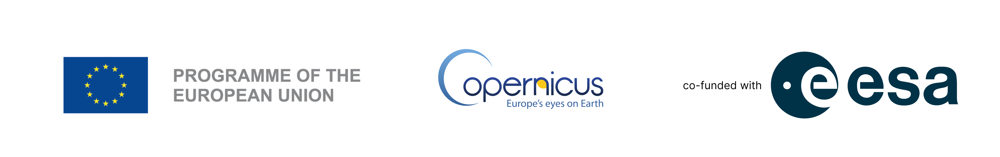